In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

import re
from collections import Counter

import nltk
from nltk.corpus import stopwords
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [2]:
def has_url(string):
    return 1 if re.search(url_pattern, string) else 0

In [3]:
def normalize_text(text):
    if pd.isna(text):  # Check if the value is NaN
        return ''  # Return empty string if NaN
    punctuation_pattern = r'[!"#$%&\'()*+,-./:;<=>?@[\\\]^_`{|}~\d]'
    normalized_word = re.sub(punctuation_pattern, '', text).lower()
    return normalized_word

def get_top_15(col, deliminator):
    normalized_dict = listings_df[col].apply(normalize_text)
    all_items = []
    for array in normalized_dict:
        items = array.split(deliminator)
        all_items.extend(items)
    # Remove empty words
    all_items = [x for x in all_items if x != '']
    # Remove stop words
    stop_word_removed_list = [item for item in all_items if item not in stop_words]
        
    item_frequency = Counter(stop_word_removed_list)

    return [item for item, _ in item_frequency.most_common(15)]

In [4]:
def convert_to_days(time_string):
    now = datetime.now()
    if 'today' in time_string:
        return 0
    elif 'yesterday' in time_string:
        return 1
    elif 'day' in time_string:
        days_ago = int(time_string.split()[0])
        return days_ago
    elif 'week' in time_string:
        if 'a week ago' in time_string:
            return 7
        weeks_ago = int(time_string.split()[0])
        return weeks_ago * 7
    elif 'month' in time_string:
        months_ago = int(time_string.split()[0])
        return months_ago * 30  # Assuming 30 days per month for simplicity
    else:
        return None  # Return None for unrecognized strings

In [5]:
def convert_tf_to_binary(columns): # convert t to 1 and f to 0
    for col_name in columns:
        column = listings_df[col_name]
        unique_values = column.unique()
        if len(unique_values) == 2 and 't' in unique_values and 'f' in unique_values:
            listings_df[col_name] = column.map({'t': 1, 'f': 0})
    return listings_df

# Intro

You are given the famous Airbnb Seattle dataset, this dataset contains two files:
1. calendar.csv
2. listings.csv
For your convenience, the data is loaded onto this notebook.

The questions are implemented within the notebook.
It is highly recommended to document the code and write your assumptions as notes.

By the end of the allocated time, you are kindly requested to save the notebook in the format of:

You are allowed to use any library you desire, however the assignment should be written in python via jupyter notebook.

* While we acknowledge that you can utilize GPT as an assistant, it is important to note that the assessment will focus on evaluating your comprehension and rationale behind each step you take. 

your_name_date_assignment

In any case, you would like some cllarifications, please send a mail to saar.teboul@explorium.ai or to alex.kremiansky@explorium.ai
    

# Main Task:
1. The purpose of this task is to predict the price of Seattle Airbnb rentals based on the data provided and any external datasets with relevant information.



### Data loading

In [6]:
calendar = pd.read_csv('calendar.csv')
listings = pd.read_csv('listings.csv')

In [7]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None) 

# Question 1: Data cleaning
1. Given your objective, write a short code which cleans the dataset. In your code, please explain what you have cleaned and why it is necessary


calendar dataset has price with missing values where available is f. By filtering for when available is t, no missing values remain in the calendar dataset. 

In [8]:
calendar_t = calendar[calendar['available'] == 't']

The datatypes of the following variables will be converted:
* date is an object and not in datetime
* available is an object but no need to hot encode since it has been filtered to only t
* price is object and should be converted to float
* listing_id should be object since there is no meaning related to the how large the number is

In [9]:
calendar_t['listing_id'] = calendar_t['listing_id'].astype(str)
calendar_t['price'] = calendar_t['price'].str.replace('$', '').str.replace(',','').astype(float)
calendar_t['date'] = pd.to_datetime(calendar_t['date'])
calendar_t.dtypes

<ipython-input-9-9b03cc2365d8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  calendar_t['listing_id'] = calendar_t['listing_id'].astype(str)
<ipython-input-9-9b03cc2365d8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  calendar_t['price'] = calendar_t['price'].str.replace('$', '').str.replace(',','').astype(float)
<ipython-input-9-9b03cc2365d8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

listing_id            object
date          datetime64[ns]
available             object
price                float64
dtype: object

In [10]:
listings_df = listings.copy()

Convert calendar_updated to one unit rather than using today, week, month to provide a more useful feature.

In [11]:
listings_df['days_ago'] = listings_df['calendar_updated'].apply(convert_to_days)

The variables country_code, jurisdiction_names, city, state, experiences_offered, smart_location do not have unique values that offer a different meaning than the other values. Therefore, these variables are dropped. 

last_scraped, scrape_id, country, market, has_availability, calendar_last_scraped, requires_license, listing_url, picture_url have only one consistent value in the dataframe. Therefore, there is no value in having these variables in the model or analysis. These variables are also dropped.

Note that calendar_last_scraped date '2016-01-04' which will be compared later on with the calendar_t dataset's price for that date.

In [12]:
print(listings['country_code'].unique())
print(listings['jurisdiction_names'].unique())
print(listings['city'].unique())
print(listings['state'].unique())
print(listings['experiences_offered'].unique())
print(listings['smart_location'].unique())

['US']
['WASHINGTON']
['Seattle' 'Ballard, Seattle' 'West Seattle' 'Seattle ' '西雅图'
 'Phinney Ridge Seattle' 'seattle']
['WA' 'wa']
['none']
['Seattle, WA' 'Ballard, Seattle, WA' 'West Seattle, WA' 'Seattle , WA'
 '西雅图, WA' 'Phinney Ridge Seattle, WA' 'seattle, wa']


In [13]:
listings_df = listings_df.drop(columns=['scrape_id','listing_url','picture_url','country_code', 'smart_location','jurisdiction_names', 'experiences_offered','state','city','calendar_updated','last_scraped', 'country', 'market', 'has_availability', 'calendar_last_scraped', 'requires_license'], inplace=False)

host_response_rate, host_acceptance_rate, columns with the term price, extra_people, security_deposit, and cleaning_fee are objects and will be changed to floats.

In [14]:
listings_df['host_response_rate']  = listings_df['host_response_rate'].str.replace("%","").astype(float) * 0.01 #decimal form because original was in %
listings_df['host_acceptance_rate']  = listings_df['host_acceptance_rate'].str.replace("%","").astype(float) * 0.01

price_columns = [col for col in listings_df.columns if 'price' in col.lower()] #get all columns with the term price
price_columns.append('extra_people')
price_columns.append('security_deposit')
price_columns.append('cleaning_fee')

for i in price_columns:
    listings_df[i] = listings_df[i].str.replace("$","").str.replace(',','').astype(float) 

id should remain an object because the numbers have no meaning.

In [15]:
id_columns = ['id', 'host_id']

for i in id_columns:
    listings_df[i] = listings_df[i].astype(str)

There are only 2 NaN for host_has_profile_pic, host_identity_verfied, host_is_superhost so I decided to change it to f. I also chose not to create another variable and flag it as missing since there are only 2 rows.

In [16]:
listings_df['host_has_profile_pic'] = listings_df['host_has_profile_pic'].fillna("f")
listings_df['host_identity_verified'] = listings_df['host_identity_verified'].fillna("f")
listings_df['host_is_superhost'] = listings_df['host_is_superhost'].fillna("f")

listing_url, thumbnail_url, medium_url, picture_url, xl_picture_url are unique. Convert if the url is present to 1 and if the url is missing to 0. These converted variables may be predictive in knowing if the host included or did not include the urls effects the listed price. 

In [17]:
url_pattern = r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+'

for column in listings_df.columns:
    if 'url' in column:
        listings_df[column] = listings_df[column].astype(str)
        listings_df[column] = listings_df[column].apply(has_url)

Check which columns have missing values.

In [18]:
for i in listings_df.columns:
    if listings_df[i].isna().sum() != 0:
        print(i)
        print(listings_df[i].isna().sum())

summary
177
space
569
neighborhood_overview
1032
notes
1606
transit
934
host_name
2
host_since
2
host_location
8
host_about
859
host_response_time
523
host_response_rate
523
host_acceptance_rate
773
host_neighbourhood
300
host_listings_count
2
host_total_listings_count
2
neighbourhood
416
zipcode
7
property_type
1
bathrooms
16
bedrooms
6
beds
1
square_feet
3721
weekly_price
1809
monthly_price
2301
security_deposit
1952
cleaning_fee
1030
first_review
627
last_review
627
review_scores_rating
647
review_scores_accuracy
658
review_scores_cleanliness
653
review_scores_checkin
658
review_scores_communication
651
review_scores_location
655
review_scores_value
656
license
3818
reviews_per_month
627
days_ago
24


Drop rows with missing host_name, host_since, host_location, zipcode, property_type since there are only 2-8 missing rows. Dropping them will not significantly affect the size of the dataset and it would not be particularly easy to string to fill it in with. 

Drop the neighbourhood column, which has 416 missing rows, and use neighbourhood_cleansed column instead. 

Fill in with median for weekly_price, monthly_price, security_deposit, cleaning_fee, square_feet, days_ago, bathrooms, bedrooms, beds.

In [19]:
listings_df.dropna(subset=['host_name','host_since','host_location','zipcode','property_type'],inplace=True)
listings_df.drop('neighbourhood', axis=1, inplace=True)

fill_in = ['weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee','square_feet','days_ago','bathrooms','bedrooms','beds']
for i in fill_in:
    listings_df[i] = listings_df[i].fillna(listings_df[i].median())

Tried to find top 15 frequently used words in space, summary, name, and description to use as features. However, it would take more time to clean up the words in the descriptions so opted to not add it in as features.

In [20]:
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

print(get_top_15('space', ' '))
print(get_top_15('summary', ' '))
print(get_top_15('name', ' '))
print(get_top_15('description', ' '))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/vivianxia/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['room', 'bed', 'seattle', 'bedroom', 'kitchen', 'space', 'home', 'house', 'one', 'living', 'queen', 'full', 'apartment', 'bathroom', 'two']
['seattle', 'downtown', 'home', 'bedroom', 'room', 'private', 'located', 'restaurants', 'apartment', 'walk', 'neighborhood', 'bus', 'hill', 'kitchen', 'bed']
['seattle', 'hill', 'room', 'home', 'private', 'capitol', 'apartment', 'cozy', 'modern', 'studio', 'view', 'downtown', 'bedroom', 'house', 'near']
['seattle', 'room', 'downtown', 'kitchen', 'bedroom', 'home', 'bed', 'space', 'apartment', 'private', 'house', 'access', 'one', 'neighborhood', 'bathroom']


Convert str columns to a column that flags missing. These flagged missing columns may be predictive in prices. For example, the host did not add a description. Will this effect the price?

In [21]:
missing_str = ['name','description','summary','space', 'neighborhood_overview','notes','transit','host_about','host_neighbourhood','license']

In [22]:
for i in missing_str:
    listings_df['missing_' + i ] = listings_df[i].notna().astype(int)
    listings_df.drop(i, axis=1,inplace=True)

Convert columns that have dates as strings to datetime.

In [23]:
date_col = ['host_since','first_review','last_review']
for i in date_col:
    listings_df[i] = pd.to_datetime(listings_df[i])

Create a column to flag missing for first_review and last_review. 

A potential way to consider in the future to make these features more useful is to make this into a column for days ago since first or last review since this was scraped. 

In [24]:
missing_str2 = ['first_review','last_review']

for i in missing_str2:
    listings_df['missing_' + i ] = listings_df[i].notna().astype(int)
    listings_df.drop(i, axis=1,inplace=True)

Create a column to flag missing host_acceptance_rate, host_response_time and host_response_rate, review_scores_rating, reviews_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_location, review_scores_value, reviews_per_month.

Fill in missing with median in the original columns.

In [25]:
miss_fill_columns = ['host_acceptance_rate','host_response_time', 'host_response_rate', 'review_scores_rating',
                      'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
                      'review_scores_communication', 'review_scores_location', 'review_scores_value',
                      'reviews_per_month']

# Create a new column for each original column to indicate missing values
for col in miss_fill_columns:
    missing_col_name = 'missing_' + col
    listings_df[missing_col_name] = listings_df[col].isna().astype(int)

# Fill missing values in the original columns with their medians
listings_df[miss_fill_columns] = listings_df[miss_fill_columns].fillna(listings_df[miss_fill_columns].median())

Fill the missing in host_response_time with the string "missing." Hot encode host_response_time unique values. This allows the missing to be flagged. 

In [26]:
listings_df['host_response_time'] = listings_df['host_response_time'].fillna("missing")

# Create new columns for each unique item
for item in listings_df['host_response_time'].unique():
    listings_df["host_response_time_" + item] = listings_df['host_response_time'].apply(lambda x: 1 if item in x else 0)
    
    # Drop the original list column
listings_df.drop('host_response_time', axis=1, inplace=True)

Filter for numerical columns to deal with outliers.

In [27]:
# Filter for columns that are numerical or float
numerical_columns = []
for column in listings_df.columns:
    if pd.api.types.is_numeric_dtype(listings_df[column]):
        if not all(listings_df[column].isin([0, 1])):
            numerical_columns.append(column)

print("Numerical columns that are not binary hot encoded:")
print(numerical_columns)

Numerical columns that are not binary hot encoded:
['host_response_rate', 'host_listings_count', 'host_total_listings_count', 'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'square_feet', 'price', 'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'calculated_host_listings_count', 'reviews_per_month', 'days_ago']


In [28]:
numerical_columns.remove('price') #remove the target variable

In [29]:
for i in numerical_columns :
    theMean = listings_df[i].mean()
    theSD = listings_df[i].std()
    theMax = listings_df[i].max()
    theMin = listings_df[i].min()
    theCutoff = round(theMean + 3*theSD)
    if theMax < theCutoff : continue
    FLAG = "O_" + i
    TRUNC = "TRUNC_" + i
    listings_df[ FLAG ] = ( listings_df[i] > theCutoff )+ 0
    listings_df[ TRUNC ] = listings_df[ i ]
    listings_df.loc[ listings_df[TRUNC] > theCutoff, TRUNC ] = theCutoff
    listings_df = listings_df.drop( i, axis=1 )

In [30]:
listings_df.zipcode.unique()

array(['98119', '98109', '98107', '98117', '98103', '98105', '98115',
       '98101', '98122', '98112', '98144', '99\n98122', '98121', '98102',
       '98199', '98104', '98134', '98136', '98126', '98146', '98116',
       '98177', '98118', '98108', '98133', '98106', '98178', '98125'],
      dtype=object)

In [31]:
listings_df['zipcode'] = listings_df['zipcode'].str.replace('99\n98122','98122') 

# Question 2:  Exploratory Data Analysis
1. Given your objective,  explore your data. Your main goal is to present some valuable insights coming from the dataset.
* Can add some valuble insight regarding the price?
* What else can you say about the data, which might help to better understand the problem?

In [32]:
calendar_t.groupby('listing_id')['price'].unique()

listing_id
10000273                                       [175.0, 200.0]
1000883                      [80.0, 90.0, 100.0, 95.0, 125.0]
10012724                                               [25.0]
10019082    [79.0, 94.0, 104.0, 124.0, 129.0, 114.0, 134.0...
10020221                                               [55.0]
10022421                                               [74.0]
10023353                                       [125.0, 150.0]
10026648                                               [65.0]
1002835                                        [135.0, 125.0]
10031055                                         [29.0, 34.0]
10035644                                        [100.0, 90.0]
10036903                                               [85.0]
1003890     [69.0, 70.0, 67.0, 78.0, 82.0, 85.0, 86.0, 89....
10043487                                               [60.0]
10060388                                       [165.0, 100.0]
10060674                                               [70.

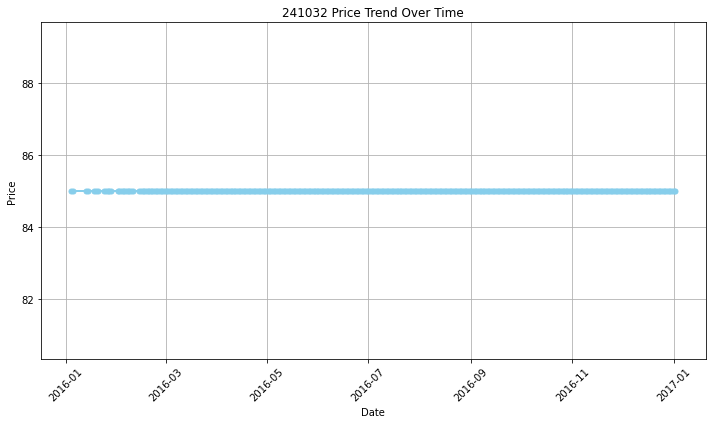

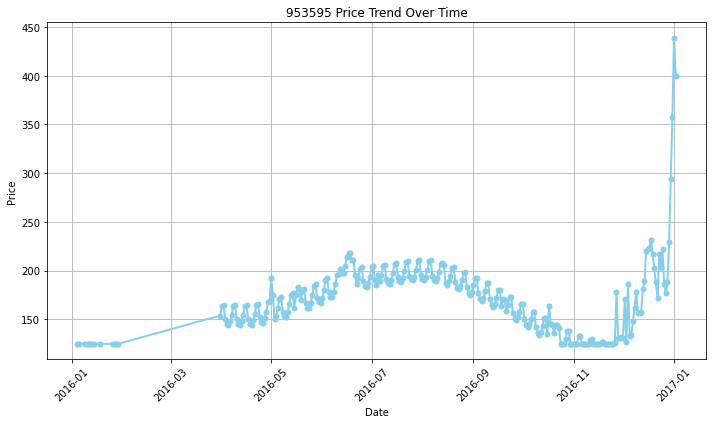

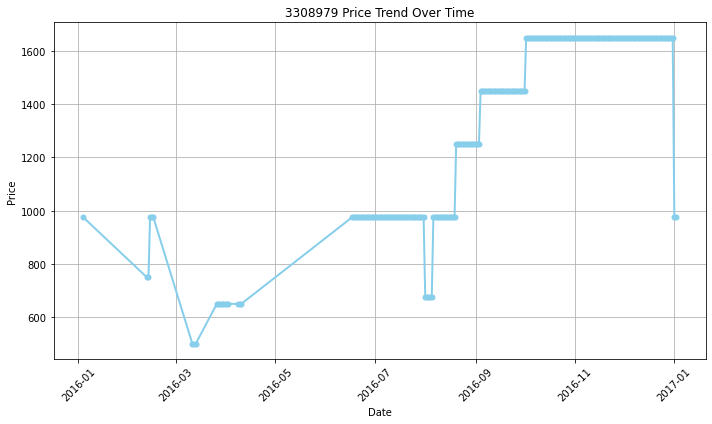

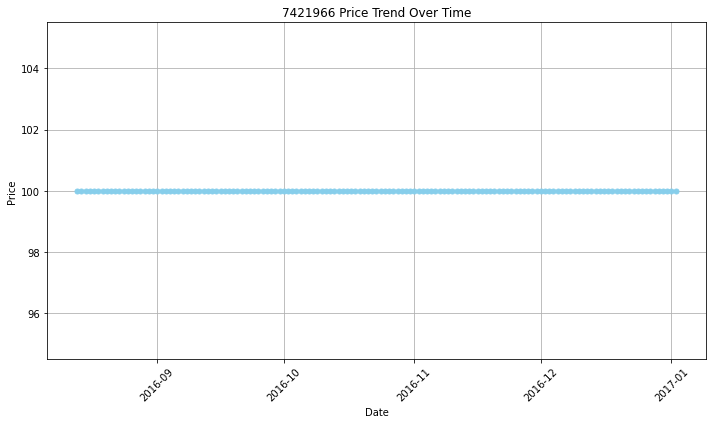

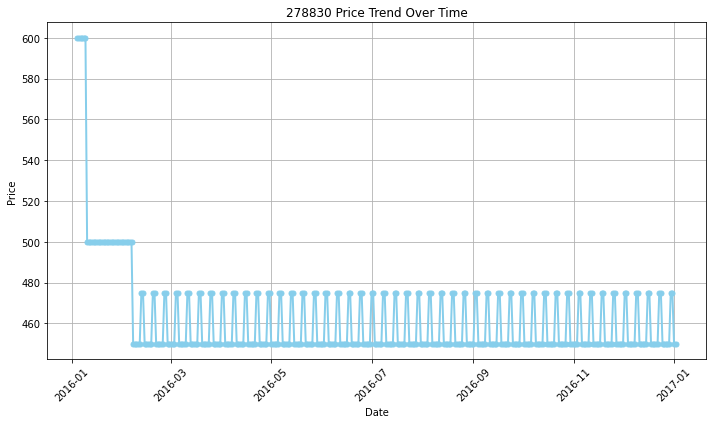

...

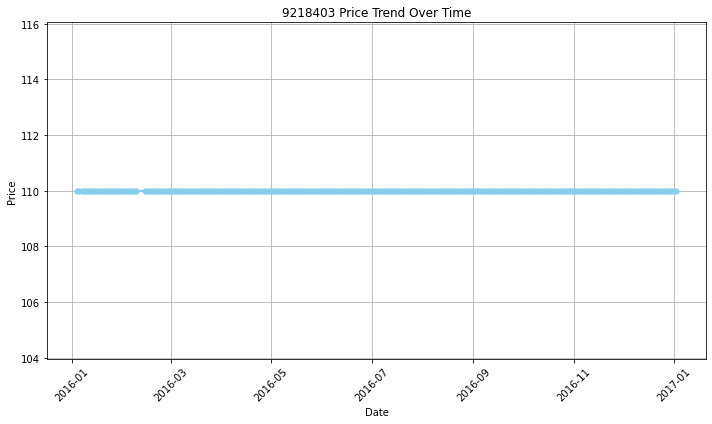

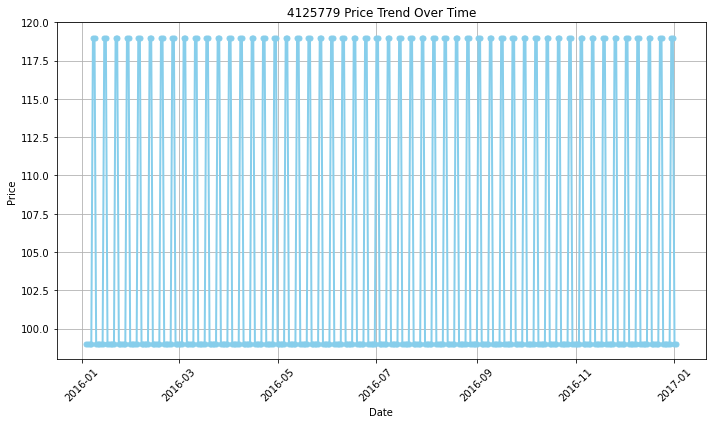

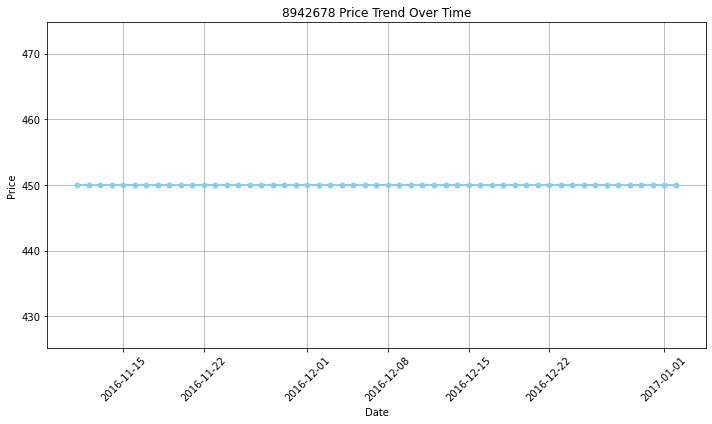

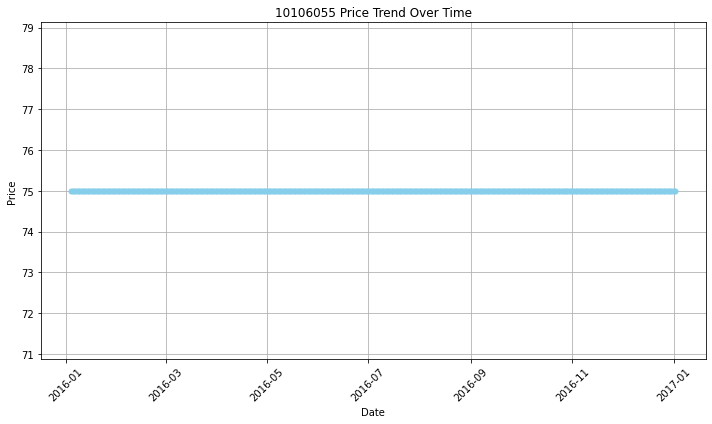

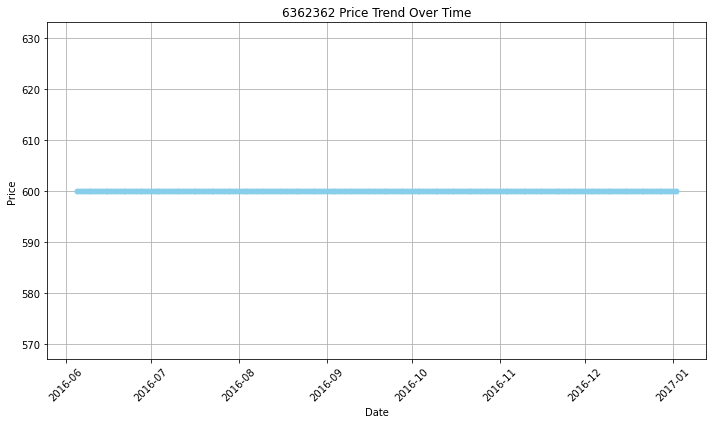

In [33]:
unique_listing_ids = calendar_t['listing_id'].unique()

# Cap the number of graphs at 25
cap = 0
for i in unique_listing_ids:
    df = calendar_t[calendar_t['listing_id'] == i]
    plt.figure(figsize=(10, 6))
    plt.plot(df.date, df.price, marker='o', color='skyblue', linewidth=2, markersize=5)
    plt.title(f'{i} Price Trend Over Time')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Increment the counter
    cap += 1
    
    # Check if we've reached the cap
    if cap >= 25:
        break

The prices vary for some properties throughout the year. There is not one consistent price trend throughout the listings.

calendar and listings dataset have inconsistent prices for the same date for the listing_id. 

In [34]:
calendar_date = calendar_t[calendar_t['date'] == '2016-01-04']
merged_df = pd.merge(calendar_date, listings_df, left_on='listing_id', right_on='id')

merged_df.drop('id', axis=1, inplace=True)

p = merged_df[merged_df['price_x'] != merged_df['price_y']]
p[['price_x','price_y']].head()

,price_x,price_y
1,125.0,150.0
3,600.0,450.0
5,42.0,60.0
6,125.0,150.0
7,69.0,99.0


calendar_t merged on to the listing_id and take the month from the calendar date to show the influence of time of the listing. 

In [35]:
calendar_t['month_scraped'] = calendar_t['date'].dt.strftime('%B')
t = pd.get_dummies(calendar_t, columns=['month_scraped'], prefix='month')

X = sm.add_constant(t.drop(columns=['listing_id','date','available','price']))
y = t['price']

# Fit linear regression model
model = sm.OLS(y, X).fit()

# Check significance
print(model.summary())

<ipython-input-35-9c8306d46493>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  calendar_t['month_scraped'] = calendar_t['date'].dt.strftime('%B')


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     557.6
Date:                Tue, 02 Apr 2024   Prob (F-statistic):               0.00
Time:                        22:47:05   Log-Likelihood:            -5.6726e+06
No. Observations:              934542   AIC:                         1.135e+07
Df Residuals:                  934529   BIC:                         1.135e+07
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             1.79e+10   9.81e+10     

The month variables are larger than 0.05 and not statistically significant in predicting price. As seen from the line graph of the price over the year for each listing, the prices are not consistent in trends for all the listings. For example, some listings stay constant at one price the whole year, some will only drop their price at one or two points in time, while some only raise the price during the end of the year. 

It is noted that the price from the calendar and listings dataset for 2016-01-4, date the listings data was scraped, is inconsistent. Going forward, price from the listings.csv will be used and assumed to be accurate. 

View the distribution of the listings dataset price.

Text(0.5, 1.0, 'Prices')

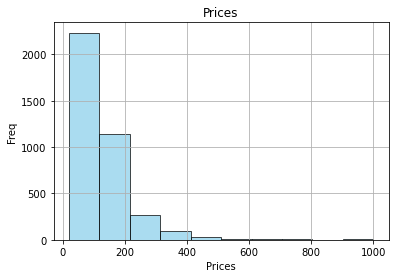

In [36]:
plt.hist(listings_df['price'],color='skyblue', edgecolor='black', alpha=0.7)
plt.ylabel('Freq')
plt.xlabel('Prices')
plt.grid(True)
plt.title('Prices')

In [37]:
listings_df['price'].describe()

count    3802.000000
mean      127.937401
std        90.242214
min        20.000000
25%        75.000000
50%       100.000000
75%       150.000000
max      1000.000000
Name: price, dtype: float64

Prices are skewed with a few large outliers as seen by the histogram and the mean being larger than the median. Most prices are around $100 a night.

The scatter plot is used to review the relationships between the numerical variables and price. 

In [38]:
# Filter for columns that are numerical or float
num_columns = []
for column in listings_df.columns:
    if pd.api.types.is_numeric_dtype(listings_df[column]):
        if not all(listings_df[column].isin([0, 1])):
            num_columns.append(column)

print("Numerical columns that are not binary hot encoded:")
print(num_columns)

num_columns.remove('price') #remove the target variable

Numerical columns that are not binary hot encoded:
['latitude', 'longitude', 'price', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'TRUNC_host_response_rate', 'TRUNC_host_listings_count', 'TRUNC_host_total_listings_count', 'TRUNC_accommodates', 'TRUNC_bathrooms', 'TRUNC_bedrooms', 'TRUNC_beds', 'TRUNC_square_feet', 'TRUNC_weekly_price', 'TRUNC_monthly_price', 'TRUNC_security_deposit', 'TRUNC_cleaning_fee', 'TRUNC_guests_included', 'TRUNC_extra_people', 'TRUNC_minimum_nights', 'TRUNC_maximum_nights', 'TRUNC_number_of_reviews', 'TRUNC_calculated_host_listings_count', 'TRUNC_reviews_per_month', 'TRUNC_days_ago']


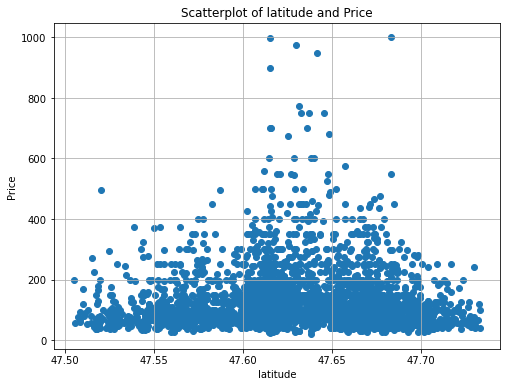

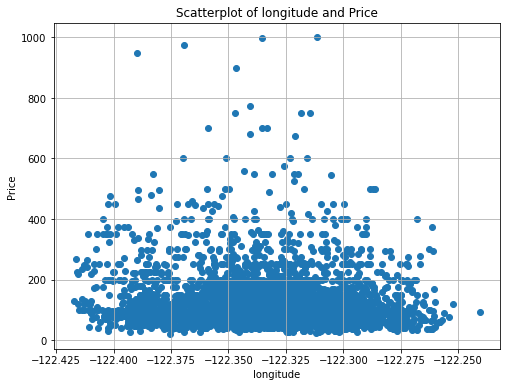

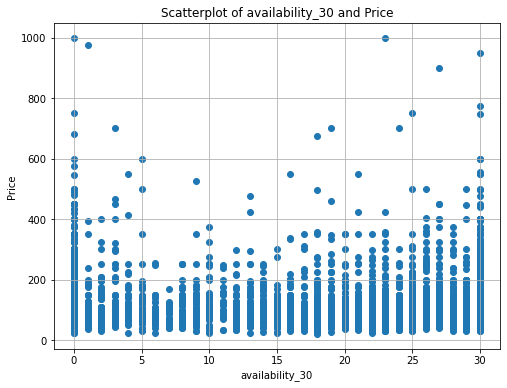

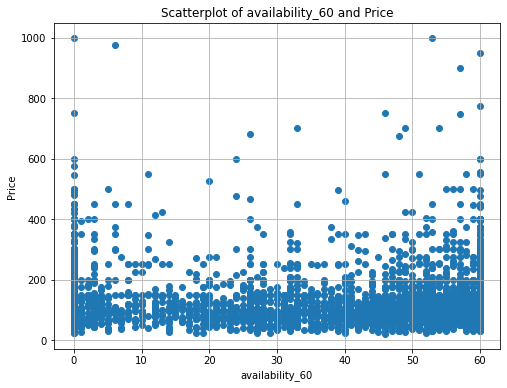

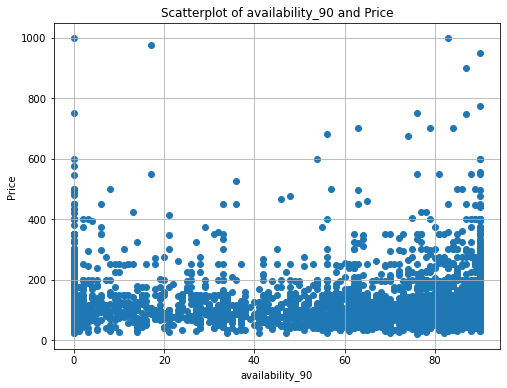

...

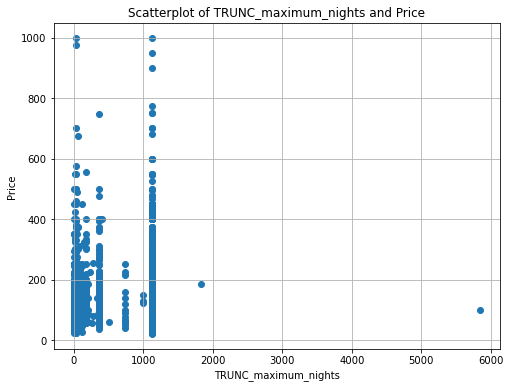

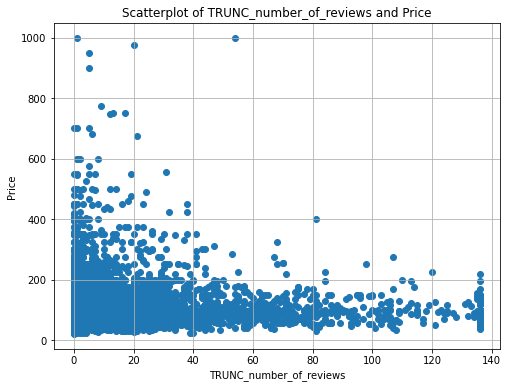

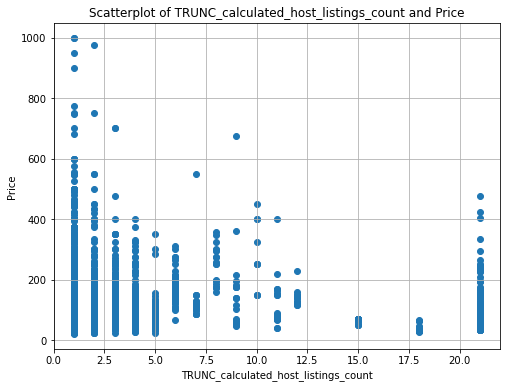

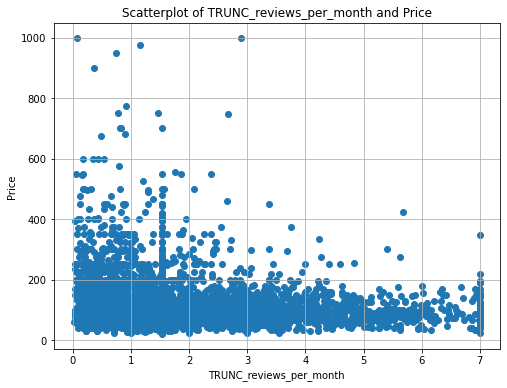

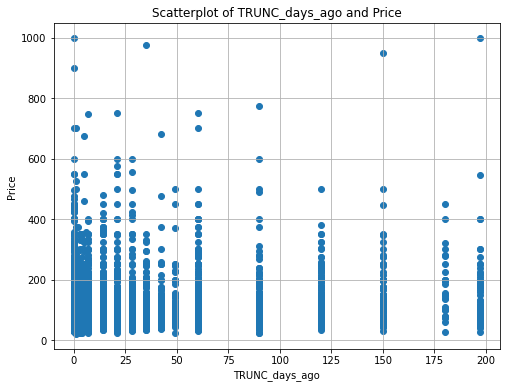

In [39]:
for i in num_columns:
    plt.figure(figsize=(8, 6))
    plt.scatter(listings_df[i],listings_df['price'])
    plt.title(f'Scatterplot of {i} and Price')
    plt.xlabel(i)
    plt.ylabel('Price')
    plt.grid(True)
    plt.show()

The review_scores_rating shows that only those with very high scores between 90-100 have very high prices while those that tend to have very low scores are lower priced. It is noted that just because the review scores are high does not mean the price will be higher. In a similar manner, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_location, review_scores_value show the pattern of high prices are only associated with high reviews. The high review scores with higher prices is intuitive because the are reputed to have people who have enjoyed their stay while factoring in how the Airbnb process and stay was. Similarly, it is reasonable that listings with low review scores will tend to be lower priced to perhaps incentivize people to stay due to it being cheaper than other listings in Seattle. 

A higher number of reviews 60-140 reviews tend to have lower prices than the listings with a lower number of reviews. The listings with 0-20 reviews tend to offer the most range in prices and higher prices. 

The higher priced listings tend to have a latitude of 47.60-47.65. This latitude may indicate a more attractive and sought-after area in which the hosts will want to price higher. 

Analyze the relationship between price and the zipcodes.

In [40]:
listings['price'] = listings_df['price']
listings['zipcode'] = listings['zipcode'].str.replace('99\n98122','98122')

In [41]:
zipcode_median = listings.groupby('zipcode')['price'].median().sort_values(ascending=False)
zipcode_median

zipcode
98134    150.0
98101    147.0
98121    139.0
98199    127.0
98104    125.0
98119    120.0
98109    119.0
98112    112.5
98136    110.0
98122    109.0
98116    105.0
98102    100.0
98107     99.0
98103     99.0
98126     99.0
98177     99.0
98117     93.5
98115     89.5
98105     88.0
98144     87.5
98133     83.0
98146     80.0
98178     79.0
98118     75.0
98106     73.5
98108     70.0
98125     70.0
Name: price, dtype: float64

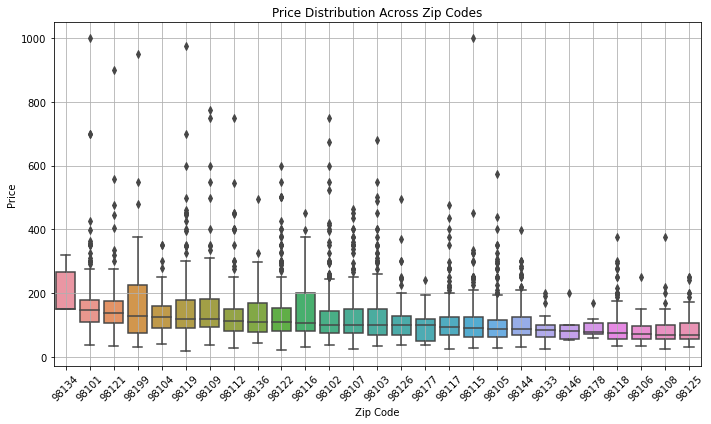

In [42]:
# Create a box plot to compare prices across different zip codes
plt.figure(figsize=(10, 6))
sns.boxplot(x='zipcode', y='price', data=listings, order=zipcode_median.index)
plt.title('Price Distribution Across Zip Codes')
plt.xlabel('Zip Code')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

As seen in the histogram of the distribution of price, the price is skewed and has a right tail of large outliers while most listings were around 75-150 which is shown in the boxplot. The median prices are 70-150 for each zipcode.

The price has outliers in every zipcode except 98134. 98134 and 98101 zipcode also has the highest median price than any other zipcode at $150 and 149, respectively, so the zipcode tends to be priced slightly higher than the other zipcodes. There is a large range of pricing for zipcodes 98199 and 98116. For 98146 and 98178, there is a small range of prices so the listings in those zipcodes may tend to be priced lower. It is noted that there are only 5 and 7 listings for 98178 and 98178 in the dataset. 

In [43]:
zipcode_counts = listings.groupby('zipcode').size().sort_values(ascending=False).reset_index(name='count')
zipcode_counts

,zipcode,count
0,98122,421
1,98103,394
2,98102,339
3,98105,225
4,98109,202
5,98101,201
6,98144,200
7,98121,196
8,98107,180
9,98115,178


# Question 3: Feature Eng.
1. What features can be engineered out of this data? Implement a few examples.


Change street column to only street name because information is being repeated with the city, state, and zipcode.

In [44]:
listings_df['street_name'] = listings_df['street'].str.split(',').str[0]

In [45]:
listings_df['street_name'].unique().shape #this would be a lot of streets to encode so drop

(1247,)

In [46]:
listings_df.drop(['street','street_name'],axis=1,inplace=True)

Convert columns with only t/f into t to 1 and f to 0

In [47]:
object_columns = listings_df.select_dtypes(include='object').columns.tolist()
listings_df = convert_tf_to_binary(object_columns)

In [48]:
listings_df = convert_tf_to_binary(['host_has_profile_pic','host_identity_verified','host_is_superhost'])

<ipython-input-5-421bed447959>:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if len(unique_values) == 2 and 't' in unique_values and 'f' in unique_values:


Find top 15 amentities. 

In [49]:
all_items = []
for array in listings_df['amenities']:
    items = array.strip('{}').split(',')
    all_items.extend(items)

item_frequency = Counter(all_items)

#for item, frequency in item_frequency.items():
    #print(f"{item}: {frequency}")
    
top_15_amenities = [item for item, _ in item_frequency.most_common(15)]
top_15_amenities

['"Wireless Internet"',
 'Heating',
 'Kitchen',
 '"Smoke Detector"',
 'Essentials',
 'Dryer',
 'Washer',
 'Internet',
 'Shampoo',
 'TV',
 '"Carbon Monoxide Detector"',
 '"Fire Extinguisher"',
 '"Free Parking on Premises"',
 '"Family/Kid Friendly"',
 '"First Aid Kit"']

In [50]:
# Create new columns for each unique item
for item in top_15_amenities:
    listings_df["amenities_" + item] = listings_df['amenities'].apply(lambda x: 1 if item in x else 0)
    
# Drop the original list column
listings_df.drop('amenities', axis=1, inplace=True)

In [51]:
listings_df.drop(['id','host_id','host_name','host_location'], axis=1, inplace=True)

Find top host verifications.

In [52]:
all_items = []
for array in listings_df['host_verifications']:
    items = array.strip('[]').split(',')
    all_items.extend(items)

item_frequency = Counter(all_items)

for item, frequency in item_frequency.items():
    print(f"{item}: {frequency}")
    
top_9_verifications = [item for item, _ in item_frequency.most_common(9)] #chose the top 9 that has a frequency of over half the total sample size
top_9_verifications

'email': 3695
 'phone': 3673
 'reviews': 3541
 'kba': 1812
 'facebook': 1921
 'linkedin': 890
 'jumio': 1286
 'google': 743
'phone': 104
 'manual_offline': 52
 'amex': 25
 'manual_online': 13
 'sent_id': 9
 'photographer': 4
: 1
 'weibo': 5
'google': 1
'reviews': 1


["'email'",
 " 'phone'",
 " 'reviews'",
 " 'facebook'",
 " 'kba'",
 " 'jumio'",
 " 'linkedin'",
 " 'google'",
 "'phone'"]

In [53]:
# Create new columns for each unique item
for item in top_9_verifications:
    listings_df['host_verifications_' + item] = listings_df['host_verifications'].apply(lambda x: 1 if item in x else 0)
    
# Drop the original list column
listings_df.drop('host_verifications', axis=1, inplace=True)

Convert host_since column to a numerical value denoting how long in years the host has been a host for.

In [54]:
listings_df['host_since_in_years'] = 2016 - listings_df['host_since'].dt.year

In [55]:
listings_df.drop(['host_since'], axis=1, inplace=True)

In [56]:
listings_df.drop(['O_weekly_price','O_monthly_price','TRUNC_weekly_price','TRUNC_monthly_price',], axis=1, inplace=True)

In [57]:
q5_df = listings_df.copy() #df to be used in q5

In [58]:
encode_list = ['neighbourhood_cleansed','neighbourhood_group_cleansed','property_type','room_type','bed_type','cancellation_policy','zipcode']
for column in encode_list:
    listings_df = pd.get_dummies(listings_df, columns=[column], prefix=column)

Find correlation of variables to ensure no multicollinearity.

In [59]:
correlation_matrix = listings_df.corr()
correlation_matrix

,thumbnail_url,medium_url,xl_picture_url,host_url,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,price,availability_30,availability_60,availability_90,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,missing_name,missing_description,missing_summary,missing_space,missing_neighborhood_overview,missing_notes,missing_transit,missing_host_about,missing_host_neighbourhood,missing_license,missing_first_review,missing_last_review,missing_host_acceptance_rate,missing_host_response_time,missing_host_response_rate,missing_review_scores_rating,missing_review_scores_accuracy,missing_review_scores_cleanliness,missing_review_scores_checkin,missing_review_scores_communication,missing_review_scores_location,missing_review_scores_value,missing_reviews_per_month,host_response_time_within a few hours,host_response_time_within an hour,host_response_time_missing,host_response_time_within a day,host_response_time_a few days or more,O_host_response_rate,TRUNC_host_response_rate,O_host_listings_count,TRUNC_host_listings_count,O_host_total_listings_count,TRUNC_host_total_listings_count,O_accommodates,TRUNC_accommodates,O_bathrooms,TRUNC_bathrooms,O_bedrooms,TRUNC_bedrooms,O_beds,TRUNC_beds,O_square_feet,TRUNC_square_feet,O_security_deposit,TRUNC_security_deposit,O_cleaning_fee,TRUNC_cleaning_fee,O_guests_included,TRUNC_guests_included,O_extra_people,TRUNC_extra_people,O_minimum_nights,TRUNC_minimum_nights,O_maximum_nights,TRUNC_maximum_nights,O_number_of_reviews,TRUNC_number_of_reviews,O_calculated_host_listings_count,TRUNC_calculated_host_listings_count,O_reviews_per_month,TRUNC_reviews_per_month,O_days_ago,TRUNC_days_ago,"amenities_""Wireless Internet""",amenities_Heating,amenities_Kitchen,"amenities_""Smoke Detector""",amenities_Essentials,amenities_Dryer,amenities_Washer,amenities_Internet,amenities_Shampoo,amenities_TV,"amenities_""Carbon Monoxide Detector""","amenities_""Fire Extinguisher""","amenities_""Free Parking on Premises""","amenities_""Family/Kid Friendly""","amenities_""First Aid Kit""",host_verifications_'email',host_verifications_ 'phone',host_verifications_ 'reviews',host_verifications_ 'facebook',host_verifications_ 'kba',host_verifications_ 'jumio',host_verifications_ 'linkedin',host_verifications_ 'google',host_verifications_'phone',host_since_in_years,neighbourhood_cleansed_Adams,neighbourhood_cleansed_Alki,neighbourhood_cleansed_Arbor Heights,neighbourhood_cleansed_Atlantic,neighbourhood_cleansed_Belltown,neighbourhood_cleansed_Bitter Lake,neighbourhood_cleansed_Briarcliff,neighbourhood_cleansed_Brighton,neighbourhood_cleansed_Broadview,neighbourhood_cleansed_Broadway,neighbourhood_cleansed_Bryant,neighbourhood_cleansed_Cedar Park,neighbourhood_cleansed_Central Business District,neighbourhood_cleansed_Columbia City,neighbourhood_cleansed_Crown Hill,neighbourhood_cleansed_Dunlap,neighbourhood_cleansed_East Queen Anne,neighbourhood_cleansed_Eastlake,neighbourhood_cleansed_Fairmount Park,neighbourhood_cleansed_Fauntleroy,neighbourhood_cleansed_First Hill,neighbourhood_cleansed_Fremont,neighbourhood_cleansed_Gatewood,neighbourhood_cleansed_Genesee,neighbourhood_cleansed_Georgetown,neighbourhood_cleansed_Green Lake,neighbourhood_cleansed_Greenwood,neighbourhood_cleansed_Haller Lake,neighbourhood_cleansed_Harrison/Denny-Blaine,neighbourhood_cleansed_High Point,neighbourhood_cleansed_Highland Park,neighbourhood_cleansed_Holly Park,neighbourhood_cleansed_Industrial District,neighbourhood_cleansed_Interbay,neighbourhood_cleansed_International District,neighbourhood_cleansed_Laurelhurst,neighbourhood_cleansed_Lawton Park,neighbourhood_cleansed_Leschi,neighbourhood_cleansed_Lower Queen Anne,neighbourhood_cleansed_Loyal Height

In [60]:
# Find variable pairs with correlation greater than 0.7
high_correlation_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if correlation_matrix.iloc[i, j] > 0.7:
            high_correlation_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))

print("Variable pairs with correlation > 0.7:")
for pair in high_correlation_pairs:
    print(pair)

Variable pairs with correlation > 0.7:
('thumbnail_url', 'medium_url')
('thumbnail_url', 'xl_picture_url')
('medium_url', 'xl_picture_url')
('availability_30', 'availability_60')
('availability_30', 'availability_90')
('availability_60', 'availability_90')
('require_guest_profile_picture', 'require_guest_phone_verification')
('missing_neighborhood_overview', 'missing_transit')
('missing_first_review', 'missing_last_review')
('missing_host_acceptance_rate', 'missing_host_response_time')
('missing_host_acceptance_rate', 'missing_host_response_rate')
('missing_host_acceptance_rate', 'host_response_time_missing')
('missing_host_response_time', 'missing_host_response_rate')
('missing_host_response_time', 'host_response_time_missing')
('missing_host_response_rate', 'host_response_time_missing')
('missing_review_scores_rating', 'missing_review_scores_accuracy')
('missing_review_scores_rating', 'missing_review_scores_cleanliness')
('missing_review_scores_rating', 'missing_review_scores_checkin

In [61]:
first_variables = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if correlation_matrix.iloc[i, j] > 0.7:
            first_variables.append(correlation_matrix.columns[i])
            break
first_variables

['thumbnail_url',
 'medium_url',
 'availability_30',
 'availability_60',
 'require_guest_profile_picture',
 'missing_neighborhood_overview',
 'missing_first_review',
 'missing_host_acceptance_rate',
 'missing_host_response_time',
 'missing_host_response_rate',
 'missing_review_scores_rating',
 'missing_review_scores_accuracy',
 'missing_review_scores_cleanliness',
 'missing_review_scores_checkin',
 'missing_review_scores_communication',
 'missing_review_scores_location',
 'missing_review_scores_value',
 'O_host_listings_count',
 'TRUNC_host_listings_count',
 'O_host_total_listings_count',
 'TRUNC_accommodates',
 'TRUNC_bedrooms',
 'O_calculated_host_listings_count',
 'amenities_"Wireless Internet"',
 'amenities_Dryer',
 "host_verifications_'email'",
 'neighbourhood_cleansed_Arbor Heights',
 'neighbourhood_cleansed_Belltown',
 'neighbourhood_cleansed_Broadway',
 'neighbourhood_cleansed_Eastlake',
 'neighbourhood_cleansed_Interbay',
 'neighbourhood_cleansed_Maple Leaf',
 'neighbourhood_c

In [62]:
listings_df1 = listings_df.copy()

In [63]:
listings_df1.columns

Index(['thumbnail_url', 'medium_url', 'xl_picture_url', 'host_url',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_has_profile_pic', 'host_identity_verified',
       ...
       'zipcode_98125', 'zipcode_98126', 'zipcode_98133', 'zipcode_98134',
       'zipcode_98136', 'zipcode_98144', 'zipcode_98146', 'zipcode_98177',
       'zipcode_98178', 'zipcode_98199'],
      dtype='object', length=275)

In [64]:
listings_df1.drop(first_variables, axis=1,inplace=True)

In [65]:
listings_df1.columns

Index(['xl_picture_url', 'host_url', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_has_profile_pic', 'host_identity_verified', 'latitude',
       'longitude',
       ...
       'zipcode_98125', 'zipcode_98126', 'zipcode_98133', 'zipcode_98134',
       'zipcode_98136', 'zipcode_98144', 'zipcode_98146', 'zipcode_98177',
       'zipcode_98178', 'zipcode_98199'],
      dtype='object', length=235)

In [66]:
filtered_list = list(listings_df1.columns)

In [67]:
filtered_list.remove("price")

Determine statistically significant variables from the features that have been cleaned. 

In [68]:
# Fit linear regression model with all predictors
X = sm.add_constant(listings_df[filtered_list])  # Drop the target variable
y = listings_df['price']
model = sm.OLS(y, X).fit()

# Get p-values for coefficients of all predictors
p_values = model.pvalues

# Extract statistically significant variables
significant_variables = p_values[p_values < 0.05].index

print("Statistically significant variables:")
print(significant_variables)

print(model.summary())

Statistically significant variables:
Index(['xl_picture_url', 'host_is_superhost', 'host_has_profile_pic',
       'host_identity_verified', 'availability_90', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_value', 'TRUNC_bathrooms',
       'O_bedrooms', 'O_beds', 'TRUNC_beds', 'O_security_deposit',
       'TRUNC_security_deposit', 'TRUNC_cleaning_fee', 'TRUNC_guests_included',
       'O_extra_people', 'TRUNC_extra_people', 'TRUNC_minimum_nights',
       'TRUNC_reviews_per_month', 'O_days_ago', 'TRUNC_days_ago',
       'amenities_Shampoo', 'amenities_"First Aid Kit"',
       'host_verifications_ 'kba'', 'host_verifications_ 'jumio'',
       'neighbourhood_cleansed_Central Business District',
       'neighbourhood_cleansed_First Hill',
       'neighbourhood_cleansed_International District',
       'neighbourhood_cleansed_Leschi',
       'neighbourhood_cleansed_Yesler Terrace'],
      dtype='object')
                            OLS Regression Results              

# Question 4: Modelling.
1. Build a model to predict the target
* Which metric would you optimize? Why?
* What is the best model score according to this metric?

As the model will be predicting price, a continuous number, root mean squared error (RMSE) will be used to measure the accuracy of the model. RMSE is in the same units as the target price, which provides a straightforward and interpretable measure of the average deviation of the predictions from the actual prices. 

Three decision tree models (simple decision tree, random forest, and gradient boosting) and four linear regression models (using only significant variables, variables chosen from the simple decision tree, variables chosen from the random forest, variables chosen from the gradient boosting algorithms).

In [69]:
import math
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import _tree
from operator import itemgetter

from sklearn.ensemble import RandomForestRegressor 
from sklearn.ensemble import RandomForestClassifier 

from sklearn.ensemble import GradientBoostingRegressor 
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report, confusion_matrix

In [70]:
def getAmtAccuracyScores( NAME, MODEL, X, Y ) :
    pred = MODEL.predict( X )
    MEAN = Y.mean()
    RMSE = math.sqrt( metrics.mean_squared_error( Y, pred))
    return [NAME, RMSE, MEAN]

In [71]:
def print_Accuracy( TITLE, LIST ) :
    print( TITLE )
    print( "======" )
    for theResults in LIST :
        NAME = theResults[0]
        ACC = theResults[1]
        print( NAME, " = ", ACC )
    print( "------\n\n" )

In [72]:
#seach variables for the model
def getTreeVars( TREE, varNames ) :
    tree_ = TREE.tree_
    varName = [ varNames[i] if i != _tree.TREE_UNDEFINED else "undefined!" for i in tree_.feature ]

    nameSet = set()
    for i in tree_.feature :
        if i != _tree.TREE_UNDEFINED :
            nameSet.add( i )
    nameList = list( nameSet )
    parameter_list = list()
    for i in nameList :
        parameter_list.append( varNames[i] )
    return parameter_list

In [73]:
X = listings_df.copy()
X = X.drop('price', axis=1 )
Y = listings_df['price']

In [74]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=0.80, test_size=0.20, random_state=1234)

print( "TRAINING = ", X_train.shape )
print( "TEST = ", X_test.shape )

TRAINING =  (3041, 274)
TEST =  (761, 274)


## Decision Tree Models

### Decision Tree

In [75]:
WHO = 'Decision_Tree'

AMT = tree.DecisionTreeRegressor( max_depth= 4 )
AMT = AMT.fit( X_train, Y_train )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train, Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test, Y_test )

print_Accuracy(WHO + "RMSE Accuracy", [ TRAIN_AMT, TEST_AMT ] )

Decision_TreeRMSE Accuracy
Decision_Tree_Train  =  57.90437218346681
Decision_Tree  =  66.6479833400411
------




In [76]:
feature_cols = list( X.columns.values )
vars_tree_loss = getTreeVars( AMT, feature_cols ) 
tree.export_graphviz(AMT,out_file='tree_a.txt',filled=True, rounded=True, feature_names = feature_cols, impurity=False, precision=0  )

In [77]:
for i in vars_tree_loss:
    print(i)

TRUNC_bathrooms
TRUNC_bedrooms
missing_host_acceptance_rate
host_verifications_'email'
room_type_Entire home/apt
room_type_Private room
neighbourhood_group_cleansed_Capitol Hill
availability_365
neighbourhood_group_cleansed_Downtown
neighbourhood_cleansed_Southeast Magnolia
TRUNC_accommodates


In [78]:
TREE_AMT = TEST_AMT.copy()

### Random Forest

In [79]:
def getEnsembleTreeVars( ENSTREE, varNames ) :
    importance = ENSTREE.feature_importances_
    index = np.argsort(importance)
    theList = []
    for i in index :
        imp_val = importance[i]
        if imp_val > np.average( ENSTREE.feature_importances_ ) :
            v = int( imp_val / np.max( ENSTREE.feature_importances_ ) * 100 )
            theList.append( ( varNames[i], v ) )
    theList = sorted(theList,key=itemgetter(1),reverse=True)
    return theList

In [80]:
WHO = 'Random Forest'
AMT = RandomForestRegressor(n_estimators = 100, random_state=1234)
AMT = AMT.fit( X_train, Y_train )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train, Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test, Y_test )

print_Accuracy( WHO + " RMSE ACCURACY", [ TRAIN_AMT, TEST_AMT ] )

Random Forest RMSE ACCURACY
Random Forest_Train  =  21.212852266549937
Random Forest  =  54.455620424296036
------




In [81]:
feature_cols = list( X.columns.values )
vars_RF_amt = getEnsembleTreeVars( AMT, feature_cols )

for i in vars_RF_amt :
    print( i )

('TRUNC_bedrooms', 100)
('TRUNC_bathrooms', 15)
('room_type_Entire home/apt', 14)
('TRUNC_accommodates', 13)
('TRUNC_cleaning_fee', 11)
('TRUNC_reviews_per_month', 8)
('TRUNC_security_deposit', 7)
('latitude', 6)
('longitude', 4)
('availability_365', 4)
('neighbourhood_group_cleansed_Downtown', 3)
('TRUNC_extra_people', 3)
('TRUNC_days_ago', 3)
('review_scores_rating', 2)
('TRUNC_number_of_reviews', 2)
('neighbourhood_cleansed_Southeast Magnolia', 2)
('neighbourhood_group_cleansed_Cascade', 1)
('neighbourhood_cleansed_South Lake Union', 1)
('host_response_time_within a few hours', 1)
('TRUNC_beds', 1)
('neighbourhood_cleansed_Belltown', 1)
("host_verifications_'email'", 1)
('missing_host_acceptance_rate', 1)
('O_bedrooms', 1)
('availability_60', 1)
('TRUNC_maximum_nights', 1)
('availability_30', 1)
('neighbourhood_group_cleansed_Capitol Hill', 1)
('neighbourhood_cleansed_Roosevelt', 1)
('TRUNC_guests_included', 1)
('host_since_in_years', 1)
('TRUNC_minimum_nights', 1)
('availability_90

In [82]:
RF_AMT = TEST_AMT.copy()

### Gradient Boosting

In [83]:
WHO = 'Gradient Boosting'
AMT = GradientBoostingRegressor(random_state=1234)
AMT = AMT.fit( X_train, Y_train  )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train, Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test, Y_test )

print_Accuracy( WHO + " RMSE ACCURACY", [ TRAIN_AMT, TEST_AMT ] )

Gradient Boosting RMSE ACCURACY
Gradient Boosting_Train  =  39.407554314803484
Gradient Boosting  =  52.33057941934668
------




In [84]:
feature_cols = list( X.columns.values )
vars_GB_amt = getEnsembleTreeVars( AMT, feature_cols )

for i in vars_GB_amt :
    print( i )

('TRUNC_bedrooms', 100)
('TRUNC_accommodates', 20)
('TRUNC_bathrooms', 18)
('TRUNC_cleaning_fee', 17)
('room_type_Entire home/apt', 13)
('latitude', 9)
('TRUNC_security_deposit', 7)
('TRUNC_reviews_per_month', 5)
('neighbourhood_cleansed_Roosevelt', 5)
('availability_365', 3)
('TRUNC_days_ago', 3)
('neighbourhood_cleansed_Southeast Magnolia', 3)
('O_bedrooms', 2)
('neighbourhood_cleansed_Belltown', 2)
('missing_host_acceptance_rate', 2)
('neighbourhood_group_cleansed_Downtown', 2)
('O_security_deposit', 2)
('property_type_Boat', 2)
('longitude', 2)
('TRUNC_extra_people', 1)
('zipcode_98101', 1)
('neighbourhood_group_cleansed_Capitol Hill', 1)
('TRUNC_guests_included', 1)
('neighbourhood_group_cleansed_Cascade', 0)
('O_bathrooms', 0)


In [85]:
GB_AMT = TEST_AMT.copy()

In [86]:
ALL_AMT = [ TREE_AMT, RF_AMT, GB_AMT ]
ALL_AMT = sorted( ALL_AMT, key = lambda x: x[1] )
print_Accuracy( "ALL DAMAGE MODEL ACCURACY", ALL_AMT )

ALL DAMAGE MODEL ACCURACY
Gradient Boosting  =  52.33057941934668
Random Forest  =  54.455620424296036
Decision_Tree  =  66.6479833400411
------




## Linear Regression

In [87]:
def getCoefLinear( MODEL, TRAIN_DATA ) :
    varNames = list( TRAIN_DATA.columns.values )
    coef_dict = {}
    coef_dict["INTERCEPT"] = MODEL.intercept_
    for coef, feat in zip(MODEL.coef_,varNames):
        coef_dict[feat] = coef
    print("\nLOSS AMOUNT")
    print("---------")
    print("Total Variables: ", len( coef_dict ) )
    for i in coef_dict :
        print( i, " = ", coef_dict[i]  )

In [88]:
WHO = "Significant Variables"
AMT = LinearRegression()
AMT = AMT.fit( X_train[significant_variables], Y_train )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train[significant_variables], Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test[significant_variables], Y_test)

print_Accuracy( WHO + " RMSE ACCURACY", [ TRAIN_AMT, TEST_AMT ] )

Significant Variables RMSE ACCURACY
Significant Variables_Train  =  61.248026262210516
Significant Variables  =  61.59370423277744
------




In [89]:
varNames = list(filtered_list )

REG_SIG_AMT_COEF = getCoefLinear( AMT, X_train[significant_variables] )
REG_SIG_AMT = TEST_AMT.copy()


LOSS AMOUNT
---------
Total Variables:  32
INTERCEPT  =  -14.622533289415898
xl_picture_url  =  -16.977627619610764
host_is_superhost  =  7.8452554636242775
host_has_profile_pic  =  -43.0072432986074
host_identity_verified  =  -13.822822148880611
availability_90  =  -0.0506429828888334
review_scores_rating  =  1.0924221016201638
review_scores_accuracy  =  6.578353835606903
review_scores_value  =  -10.949570716961784
TRUNC_bathrooms  =  32.210121755230546
O_bedrooms  =  102.84796078574189
O_beds  =  -23.033692925040828
TRUNC_beds  =  20.209110214343312
O_security_deposit  =  31.242472264307285
TRUNC_security_deposit  =  0.04748939617483394
TRUNC_cleaning_fee  =  0.6175407048828485
TRUNC_guests_included  =  9.297782661548004
O_extra_people  =  55.34181453627383
TRUNC_extra_people  =  -0.23403335424205654
TRUNC_minimum_nights  =  -1.3008674948697396
TRUNC_reviews_per_month  =  -2.438454809375777
O_days_ago  =  -17.965733226327444
TRUNC_days_ago  =  0.21791443077952666
amenities_Shampoo  

In [90]:
WHO = "REG_DecisionTree_Variables"

AMT = LinearRegression()
AMT = AMT.fit( X_train[vars_tree_loss], Y_train )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train[vars_tree_loss], Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test[vars_tree_loss], Y_test )

print_Accuracy( WHO + " RMSE ACCURACY", [ TRAIN_AMT, TEST_AMT ] )

REG_DecisionTree_Variables RMSE ACCURACY
REG_DecisionTree_Variables_Train  =  59.76535494397508
REG_DecisionTree_Variables  =  61.32931538812659
------




In [91]:
varNames = list( X_train.columns.values )

REG_TREE_AMT_COEF = getCoefLinear( AMT, X_train[vars_tree_loss] )
REG_TREE_AMT = TEST_AMT.copy()


LOSS AMOUNT
---------
Total Variables:  12
INTERCEPT  =  -51.271263917090934
TRUNC_bathrooms  =  36.23527785060817
TRUNC_bedrooms  =  30.139395848707522
missing_host_acceptance_rate  =  26.695139273979965
host_verifications_'email'  =  -15.331522356079637
room_type_Entire home/apt  =  65.64637728627625
room_type_Private room  =  26.30023071132731
neighbourhood_group_cleansed_Capitol Hill  =  21.132304066288
availability_365  =  0.043491529385464744
neighbourhood_group_cleansed_Downtown  =  32.59150046393384
neighbourhood_cleansed_Southeast Magnolia  =  84.51576221295726
TRUNC_accommodates  =  10.194039247887886


In [92]:
WHO = "REG_Random_Forest_Variables"
vars_RF = [pair[0] for pair in vars_RF_amt]

AMT = LinearRegression()
AMT = AMT.fit( X_train[vars_RF], Y_train )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train[vars_RF], Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test[vars_RF], Y_test )

print_Accuracy( WHO + " RMSE ACCURACY", [ TRAIN_AMT, TEST_AMT ] )

REG_Random_Forest_Variables RMSE ACCURACY
REG_Random_Forest_Variables_Train  =  56.26670807177718
REG_Random_Forest_Variables  =  56.09011787993922
------




In [93]:
varNames = list( X_train.columns.values )

REG_RandomForest_AMT_COEF = getCoefLinear( AMT, X_train[vars_RF] )
REG_RandomForest_AMT = TEST_AMT.copy()


LOSS AMOUNT
---------
Total Variables:  34
INTERCEPT  =  -18442.984376430322
TRUNC_bedrooms  =  22.754323776829786
TRUNC_bathrooms  =  26.98825980874975
room_type_Entire home/apt  =  36.30427450801122
TRUNC_accommodates  =  8.559798644784674
TRUNC_cleaning_fee  =  0.34607896835575325
TRUNC_reviews_per_month  =  -1.0427266749193547
TRUNC_security_deposit  =  0.06603655489356441
latitude  =  -21.33113234701849
longitude  =  -158.1397052959891
availability_365  =  0.016415178243609496
neighbourhood_group_cleansed_Downtown  =  29.880247452630556
TRUNC_extra_people  =  0.07629761854820083
TRUNC_days_ago  =  0.15961563637302956
review_scores_rating  =  0.7893904109712231
TRUNC_number_of_reviews  =  0.026333307801950756
neighbourhood_cleansed_Southeast Magnolia  =  81.40209265378782
neighbourhood_group_cleansed_Cascade  =  28.868433095577245
neighbourhood_cleansed_South Lake Union  =  15.023644572840885
host_response_time_within a few hours  =  7.641232339085667
TRUNC_beds  =  -2.67888711179

In [94]:
WHO = "REG_GB_Variables"
vars_GB = [pair[0] for pair in vars_GB_amt]

AMT = LinearRegression()
AMT = AMT.fit( X_train[vars_GB], Y_train )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train[vars_GB], Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test[vars_GB], Y_test )

print_Accuracy( WHO + " RMSE ACCURACY", [ TRAIN_AMT, TEST_AMT ] )

REG_GB_Variables RMSE ACCURACY
REG_GB_Variables_Train  =  56.38146692320673
REG_GB_Variables  =  56.21012294795318
------




In [95]:
varNames = list( X_train.columns.values )

REG_GB_AMT_COEF = getCoefLinear( AMT, X_train[vars_GB] )
REG_GB_AMT = TEST_AMT.copy()


LOSS AMOUNT
---------
Total Variables:  26
INTERCEPT  =  -18377.15587176956
TRUNC_bedrooms  =  22.186589518871884
TRUNC_accommodates  =  7.66286797694578
TRUNC_bathrooms  =  26.100763649437564
TRUNC_cleaning_fee  =  0.3241751673044986
room_type_Entire home/apt  =  35.17302348495243
latitude  =  -29.4042257179941
TRUNC_security_deposit  =  0.050007768495403226
TRUNC_reviews_per_month  =  -0.32734013531011075
neighbourhood_cleansed_Roosevelt  =  27.85373644516014
availability_365  =  0.029985155743971204
TRUNC_days_ago  =  0.1454742499394625
neighbourhood_cleansed_Southeast Magnolia  =  85.44292363476133
O_bedrooms  =  94.75780686137982
neighbourhood_cleansed_Belltown  =  8.665022263554167
missing_host_acceptance_rate  =  17.582700956157264
neighbourhood_group_cleansed_Downtown  =  26.2512169640533
O_security_deposit  =  28.09248521502876
property_type_Boat  =  136.55098947270224
longitude  =  -161.29162593652777
TRUNC_extra_people  =  0.07987849915654932
zipcode_98101  =  4.29200425347

In [96]:
ALL_AMT = [ TREE_AMT, RF_AMT, GB_AMT, REG_SIG_AMT, REG_TREE_AMT, REG_RandomForest_AMT, REG_GB_AMT ]
ALL_AMT = sorted( ALL_AMT, key = lambda x: x[1] )
print_Accuracy( "ALL DAMAGE MODEL ACCURACY", ALL_AMT )

ALL DAMAGE MODEL ACCURACY
Gradient Boosting  =  52.33057941934668
Random Forest  =  54.455620424296036
REG_Random_Forest_Variables  =  56.09011787993922
REG_GB_Variables  =  56.21012294795318
REG_DecisionTree_Variables  =  61.32931538812659
Significant Variables  =  61.59370423277744
Decision_Tree  =  66.6479833400411
------




Based on the RMSE, the best model is the Gradient Boosting (GB) model. The Random Forest (RF) tree model, linear regression using RF variables, and linear regression using GB variables followed closely behind in accuracy. In terms of interpretability, the regression model using GB variables would be the best model. It uses 26 variables, as compared to the linear regression using RF variables of 34 variables, that are associated with coefficients that can explain the effect of each variable on the dependent variable. The GB and RF tree models are more accurate but could be more difficult to interpret. 

# Question 5: External Data
Imagine that you could have access to external data sources, which you could join with your data in order to better predict the price.
1. Which dataset would you add? Could you give examples of features that might help?
2. Could you try adding one external data source (from the internet) to your data? Did it help the accuracy of your model?

External data that could be added:
* weather patterns
* proximity to grocery stores, hospitals, national parks (Mount Rainier), tourist attractions (Space Needle), malls/shopping centers, cafes, transit, bars
* year the Airbnb was built/last renovated
* median income of the area
* demographic of the neighborhood (young adults, families, senior citizens, etc.)
* recent catastrophic events (history of attacks, natural disasters, pandemic, etc.) in the area
* crime rate in neighborhood
* website traffic to tourist attractions, hotels, or competing rental websites (Ex. uptick in website traffic and purchases in tickets to the Space Needle)
* economic condition of the country (GDP, inflation, unemployment rate)
* review comments 
* cost of furniture pieces

The median household income by Seattle's zipcodes have been added as an exteral data source. 

In [97]:
# URL of the website with the table
url = 'https://zipatlas.com/us/wa/seattle/zip-code-comparison/highest-median-household-income.htm'

# Use pandas to read the HTML table into a list of DataFrame objects
tables = pd.read_html(url)
median_income_zip = tables[0]

In [98]:
median_income_zip = median_income_zip.filter(['Zip Code', 'Household Income'])

In [99]:
median_income_zip.head(2)

,Zip Code,Household Income
0,98164,"$250,001"
1,98199,"$168,132"


In [100]:
median_income_zip['Zip Code'] = median_income_zip['Zip Code'].astype(str)

In [101]:
df0 = pd.merge(median_income_zip, q5_df, left_on='Zip Code', right_on='zipcode')

In [102]:
df0.head(2)

,Zip Code,Household Income,thumbnail_url,medium_url,xl_picture_url,host_url,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,neighbourhood_group_cleansed,zipcode,latitude,longitude,is_location_exact,property_type,room_type,bed_type,price,availability_30,availability_60,availability_90,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,missing_name,missing_description,missing_summary,missing_space,missing_neighborhood_overview,missing_notes,missing_transit,missing_host_about,missing_host_neighbourhood,missing_license,missing_first_review,missing_last_review,missing_host_acceptance_rate,missing_host_response_time,missing_host_response_rate,missing_review_scores_rating,missing_review_scores_accuracy,missing_review_scores_cleanliness,missing_review_scores_checkin,missing_review_scores_communication,missing_review_scores_location,missing_review_scores_value,missing_reviews_per_month,host_response_time_within a few hours,host_response_time_within an hour,host_response_time_missing,host_response_time_within a day,host_response_time_a few days or more,O_host_response_rate,TRUNC_host_response_rate,O_host_listings_count,TRUNC_host_listings_count,O_host_total_listings_count,TRUNC_host_total_listings_count,O_accommodates,TRUNC_accommodates,O_bathrooms,TRUNC_bathrooms,O_bedrooms,TRUNC_bedrooms,O_beds,TRUNC_beds,O_square_feet,TRUNC_square_feet,O_security_deposit,TRUNC_security_deposit,O_cleaning_fee,TRUNC_cleaning_fee,O_guests_included,TRUNC_guests_included,O_extra_people,TRUNC_extra_people,O_minimum_nights,TRUNC_minimum_nights,O_maximum_nights,TRUNC_maximum_nights,O_number_of_reviews,TRUNC_number_of_reviews,O_calculated_host_listings_count,TRUNC_calculated_host_listings_count,O_reviews_per_month,TRUNC_reviews_per_month,O_days_ago,TRUNC_days_ago,"amenities_""Wireless Internet""",amenities_Heating,amenities_Kitchen,"amenities_""Smoke Detector""",amenities_Essentials,amenities_Dryer,amenities_Washer,amenities_Internet,amenities_Shampoo,amenities_TV,"amenities_""Carbon Monoxide Detector""","amenities_""Fire Extinguisher""","amenities_""Free Parking on Premises""","amenities_""Family/Kid Friendly""","amenities_""First Aid Kit""",host_verifications_'email',host_verifications_ 'phone',host_verifications_ 'reviews',host_verifications_ 'facebook',host_verifications_ 'kba',host_verifications_ 'jumio',host_verifications_ 'linkedin',host_verifications_ 'google',host_verifications_'phone',host_since_in_years
0,98199,"$168,132",1,1,1,1,1.0,0,1,1,1,1,Lawton Park,Magnolia,98199,47.659470,-122.401873,1,House,Entire home/apt,Real Bed,200.0,0,0,0,152,90.0,9.0,9.0,10.0,10.0,10.0,9.0,0,moderate,0,0,1,1,1,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0.5,0,1.0,0,1.0,0,6,0,2.5,0,3.0,0,3.0,0,750.0,0,200.0,0,75.0,0,1,0,0.0,0,1,0,1125,0,2,0,1,0,0.43,0,120.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,1,1,0,1,1
1,98199,"$168,132",1,1,1,1,1.0,0,1,1,1,1,Lawton Park,Magnolia,98199,47.654211,-122.408389,1,House,Entire home/apt,Real Bed,229.0,30,60,89,89,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,strict,0,0,1,1,1,1,1,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.0,0,4.0,0,4.0,0,7,0,2.0,0,3.0,0,3.0,0,750.0,0,300.0,0,150.0,0,6,0,25.0,0,2,0,1125,0,4,0,4,0,0.74,0,3.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,4


In [103]:
df0.drop(["Zip Code", "zipcode"], axis=1,inplace=True) #dropping because there will likely be multicollinearity between them and the income

In [104]:
encode_list.remove('zipcode')

In [105]:
for column in encode_list:
    df0 = pd.get_dummies(df0, columns=[column], prefix=column)

In [106]:
df0['Household Income'] = df0['Household Income'].str.replace("$","").str.replace(',','').astype(float)

In [107]:
X = df0.copy()
X = X.drop('price', axis=1 )
Y = df0['price']

In [108]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=0.80, test_size=0.20, random_state=1234)

print( "TRAINING = ", X_train.shape )
print( "TEST = ", X_test.shape )

TRAINING =  (3041, 248)
TEST =  (761, 248)


In [109]:
vars_RF.append("Household Income")

In [110]:
WHO = "REG_RF_Income"

AMT = LinearRegression()
AMT = AMT.fit( X_train[vars_RF], Y_train )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train[vars_RF], Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test[vars_RF], Y_test )

print_Accuracy( WHO + " RMSE ACCURACY", [ TRAIN_AMT, TEST_AMT ] )

REG_RF_Income RMSE ACCURACY
REG_RF_Income_Train  =  56.61019497836298
REG_RF_Income  =  54.314716593411205
------




In [111]:
varNames = list( X_train.columns.values )

REG_RF_Income_COEF = getCoefLinear( AMT, X_train[vars_RF] )
REG_RF_Income_AMT = TEST_AMT.copy()


LOSS AMOUNT
---------
Total Variables:  35
INTERCEPT  =  -20947.596296594045
TRUNC_bedrooms  =  21.536349411874255
TRUNC_bathrooms  =  23.983050685453904
room_type_Entire home/apt  =  37.19190427554578
TRUNC_accommodates  =  9.116149638655443
TRUNC_cleaning_fee  =  0.3481509260155648
TRUNC_reviews_per_month  =  -1.161344215971331
TRUNC_security_deposit  =  0.06294236433641431
latitude  =  -28.129857413576815
longitude  =  -181.12677478020808
availability_365  =  0.005095629506683547
neighbourhood_group_cleansed_Downtown  =  33.2239627531577
TRUNC_extra_people  =  0.11883864426121146
TRUNC_days_ago  =  0.17376148911811223
review_scores_rating  =  1.0198219242367208
TRUNC_number_of_reviews  =  0.043887954789433546
neighbourhood_cleansed_Southeast Magnolia  =  87.91944723406053
neighbourhood_group_cleansed_Cascade  =  19.223353436895493
neighbourhood_cleansed_South Lake Union  =  6.054947151963213
host_response_time_within a few hours  =  10.913699818315065
TRUNC_beds  =  -1.461504430029

In [112]:
WHO = 'GB_Income'
AMT = GradientBoostingRegressor(random_state=1234)
AMT = AMT.fit( X_train, Y_train  )

TRAIN_AMT = getAmtAccuracyScores( WHO + "_Train", AMT, X_train, Y_train )
TEST_AMT = getAmtAccuracyScores( WHO, AMT, X_test, Y_test )

print_Accuracy( WHO + " RMSE ACCURACY", [ TRAIN_AMT, TEST_AMT ] )

GB_Income RMSE ACCURACY
GB_Income_Train  =  39.921606529851736
GB_Income  =  50.47081258198181
------




In [113]:
feature_cols = list( X.columns.values )
vars_GB_amt = getEnsembleTreeVars( AMT, feature_cols )

for i in vars_GB_amt :
    print( i )

('TRUNC_bedrooms', 100)
('TRUNC_accommodates', 27)
('TRUNC_cleaning_fee', 24)
('TRUNC_bathrooms', 20)
('room_type_Entire home/apt', 13)
('TRUNC_security_deposit', 8)
('latitude', 7)
('neighbourhood_cleansed_Roosevelt', 6)
('O_bedrooms', 4)
('neighbourhood_cleansed_Southeast Magnolia', 4)
('missing_host_acceptance_rate', 4)
('property_type_Boat', 3)
('TRUNC_reviews_per_month', 3)
('O_bathrooms', 2)
('longitude', 2)
('TRUNC_extra_people', 2)
('neighbourhood_group_cleansed_Downtown', 2)
('review_scores_rating', 1)
('TRUNC_minimum_nights', 1)
('TRUNC_number_of_reviews', 1)
('neighbourhood_group_cleansed_Queen Anne', 1)
('Household Income', 1)
('neighbourhood_cleansed_Belltown', 1)
('TRUNC_days_ago', 1)


In [114]:
GB_Income_AMT = TEST_AMT.copy()

In [115]:
ALL_AMT = [ TREE_AMT, RF_AMT, GB_AMT, REG_SIG_AMT, REG_TREE_AMT, REG_RandomForest_AMT, REG_GB_AMT, REG_RF_Income_AMT, GB_Income_AMT]
ALL_AMT = sorted( ALL_AMT, key = lambda x: x[1] )
print_Accuracy( "ALL DAMAGE MODEL ACCURACY", ALL_AMT )

ALL DAMAGE MODEL ACCURACY
GB_Income  =  50.47081258198181
Gradient Boosting  =  52.33057941934668
REG_RF_Income  =  54.314716593411205
Random Forest  =  54.455620424296036
REG_Random_Forest_Variables  =  56.09011787993922
REG_GB_Variables  =  56.21012294795318
REG_DecisionTree_Variables  =  61.32931538812659
Significant Variables  =  61.59370423277744
Decision_Tree  =  66.6479833400411
------




The median income in each zipcode did improve the model accuracy in predicting the loss amount and was a more useful feature than the hot encoded zipcodes. Only the GB tree used one of the zipcodes. The median income seems to provide more context than its zipcode counterpart. With the addition of the income, the GB also improved in its accuracy. 

# Question 6:  Insights - NOTICE THAT THIS IS AN IMPORTANT PART FOR US!


1. As a data scientist, one crucial aspect of your role is to deduce meaningful insights from the data that will be presented to the management. Could you please explain the importance of this step and how you plan to approach it?

In terms of the data, the management needs to understand the variables and any bias that are associated with it including the meaning of the variables and the population it represents. For instance, this listings data was scraped on January 4, 2016. With inflation, the data is most likely not representative of the prices in 2024. Therefore, the model would most likely need to be recalibrated and updated. For this aspect, I would explain the background/context of the data. This context would also provide an opportunity to provide feedback to include or convert any variables towards the management's preference or business knowledge. 

The model needs to be able to be intuitive and follow patterns that are observed throughout exploratory data analysis. For instance, the encoded zipcodes were not commonly chosen as variables in the tree models except for one of the zipcodes that had a higher median than the others with a larger sample size than the other zipcodes. The review scores variable tended to be used in a few of the models as well as one of the variables that had a relationship with the dependent variable from the scatter plots and from the OLS Regression Results. 

To show the relationships between the variables and price, I would show the relationships in a graph visualization to provide evidence of the relationship. With the analysis, it is helpful to visualize and highlight the relationships through graphs and explaining any technical terms in non-technical terms. For example, I would explain how the statistically significant variables were determined in simpler terms without using terminology such as p-value and rejecting the null hypothesis test but rather that the result was determined because there was sufficient evidence that suggests there is an effect from the variable on the price and not just due to random chance. I would also explain the parts of the model including defining the coefficients associated with the linear regression model as well as the reasoning for certain recommendations including model choice.